In [1]:
import os
import pandas as pd   # importing and manipulating data
import numpy as np    # for performing linear algebric functions
import matplotlib.pyplot as plt    #visualization of data
plt.style.use('ggplot')
import seaborn as sns

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import re
from nltk.tokenize import WordPunctTokenizer
tok = WordPunctTokenizer()


import plotly.express as px
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

from wordcloud import WordCloud, STOPWORDS

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

from iso3166 import countries

In [2]:
dislearn_df = pd.read_csv('E:/Project 5 credits/Final Project/Distance Learning/tweets_raw.csv',lineterminator='\n')
dislearn_df.head()

,Unnamed: 0,Unnamed: 0.1,Content,Location,Username,Retweet-Count,Favorites,Created at\r
0,0,0,innovate an innovative approach #quoteoftheday...,NaN,PaulBillygraha1,0,0,2020-08-02 04:56:27\r
1,1,1,The pandemic is raising concerns about how tee...,Worldwide,IAM__Network,0,0,2020-08-02 04:49:43\r
2,2,2,STI: Staying Education-ready in the New Normal...,Worldwide,IAM__Network,0,0,2020-08-02 04:32:36\r
3,3,3,Digital Learning Through Digital RCRT\n.\n.\nR...,NaN,digitalrcrt,0,0,2020-08-02 04:30:12\r
4,4,4,"Upswing Classroom: Out and Out Virtual School,...",India,etr_in,1,0,2020-08-02 04:00:21\r


In [3]:
dislearn_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202645 entries, 0 to 202644
Data columns (total 8 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Unnamed: 0     202645 non-null  int64 
 1   Unnamed: 0.1   202645 non-null  int64 
 2   Content        202645 non-null  object
 3   Location       155123 non-null  object
 4   Username       202645 non-null  object
 5   Retweet-Count  202645 non-null  int64 
 6   Favorites      202645 non-null  int64 
    202645 non-null  object
dtypes: int64(4), object(4)
memory usage: 12.4+ MB


In [4]:
del dislearn_df["Unnamed: 0"]
del dislearn_df["Unnamed: 0.1"]

In [5]:
dislearn_df.head()

,Content,Location,Username,Retweet-Count,Favorites,Created at\r
0,innovate an innovative approach #quoteoftheday...,NaN,PaulBillygraha1,0,0,2020-08-02 04:56:27\r
1,The pandemic is raising concerns about how tee...,Worldwide,IAM__Network,0,0,2020-08-02 04:49:43\r
2,STI: Staying Education-ready in the New Normal...,Worldwide,IAM__Network,0,0,2020-08-02 04:32:36\r
3,Digital Learning Through Digital RCRT\n.\n.\nR...,NaN,digitalrcrt,0,0,2020-08-02 04:30:12\r
4,"Upswing Classroom: Out and Out Virtual School,...",India,etr_in,1,0,2020-08-02 04:00:21\r


In [6]:
dislearn_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202645 entries, 0 to 202644
Data columns (total 6 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   Content        202645 non-null  object
 1   Location       155123 non-null  object
 2   Username       202645 non-null  object
 3   Retweet-Count  202645 non-null  int64 
 4   Favorites      202645 non-null  int64 
    202645 non-null  object
dtypes: int64(2), object(4)
memory usage: 9.3+ MB


In [7]:
dislearn_df.describe()

,Retweet-Count,Favorites
count,202645.000000,202645.000000
mean,1.354803,5.000518
std,19.532750,75.201292
min,0.000000,0.000000
25%,0.000000,0.000000
50%,0.000000,1.000000
75%,1.000000,2.000000
max,4070.000000,16174.000000


In [8]:
print('Shape of tweets dataframe : {}'.format(dislearn_df.shape))

Shape of tweets dataframe : (202645, 6)


In [9]:
import seaborn as sns
import matplotlib.pyplot as plt

def return_missing_values(data_frame):
    missing_values = data_frame.isnull().sum()/len(data_frame)
    missing_values = missing_values[missing_values>0]
    missing_values.sort_values(inplace=True)
    return missing_values

def plot_missing_values(data_frame):
    missing_values = return_missing_values(data_frame)
    missing_values = missing_values.to_frame()
    missing_values.columns = ['Precentage']
    missing_values.index.names = ['Name']
    missing_values['Name'] = missing_values.index
    sns.set(style='whitegrid', color_codes=True)
    sns.barplot(x='Name', y='Precentage', data=missing_values)
    plt.xticks(rotation=90)
    plt.show()

In [10]:
return_missing_values(dislearn_df)

Location    0.234509
dtype: float64

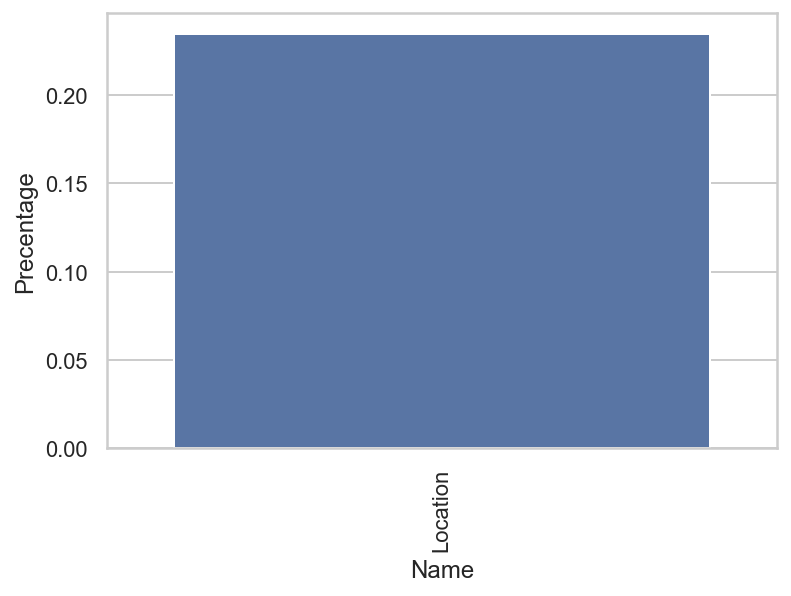

In [11]:
plot_missing_values(dislearn_df)

In [12]:
dislearn_df.corr()

,Retweet-Count,Favorites
Retweet-Count,1.000000,0.729852
Favorites,0.729852,1.000000


Text(0.5, 1.0, 'Correlation Heatmap')

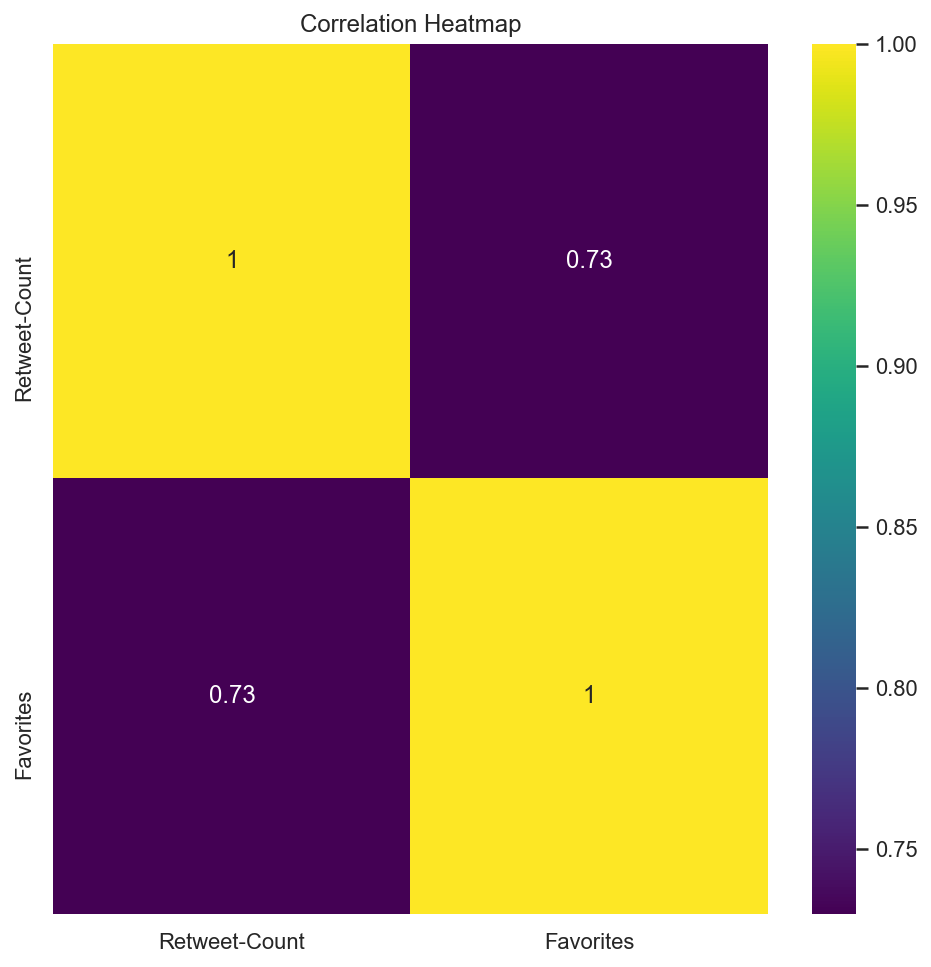

In [13]:
plt.figure(figsize=(8,8))
sns.heatmap(dislearn_df.corr(), annot=True, cmap="viridis").set_title('Correlation Heatmap')

In [14]:
dislearn_df = dislearn_df.rename(columns={'Content': 'text','Username': 'user_name','Location': 'user_location','Created at\r':'date'})
dislearn_df.head()

,text,user_location,user_name,Retweet-Count,Favorites,date
0,innovate an innovative approach #quoteoftheday...,NaN,PaulBillygraha1,0,0,2020-08-02 04:56:27\r
1,The pandemic is raising concerns about how tee...,Worldwide,IAM__Network,0,0,2020-08-02 04:49:43\r
2,STI: Staying Education-ready in the New Normal...,Worldwide,IAM__Network,0,0,2020-08-02 04:32:36\r
3,Digital Learning Through Digital RCRT\n.\n.\nR...,NaN,digitalrcrt,0,0,2020-08-02 04:30:12\r
4,"Upswing Classroom: Out and Out Virtual School,...",India,etr_in,1,0,2020-08-02 04:00:21\r


In [15]:
ds = dislearn_df['user_location'].value_counts().reset_index()
ds.columns = ['user_location', 'count']
ds = ds[ds['user_location']!='NA']
ds = ds.sort_values(['count'])

fig = px.bar(
    ds.tail(20), 
    x="count", 
    y="user_location", 
    orientation='h', title='Top 20 user locations by number of tweets', 
    width=800, 
    height=800
)

fig.show()

In [16]:
ds.head()

,user_location,count
18559,IG-bomb3r,1
24742,Manila,1
24743,UA ‘21,1
24744,C҉a҉n҉a҉d҉a҉,1
24745,teddy • he/him • 18 • blm,1


In [17]:
def pie_count(data, field, percent_limit, title):
    
    data[field] = data[field].fillna('NA')
    data = data[field].value_counts().to_frame()

    total = data[field].sum()
    data['percentage'] = 100 * data[field]/total    

    percent_limit = percent_limit
    otherdata = data[data['percentage'] < percent_limit] 
    others = otherdata['percentage'].sum()  
    maindata = data[data['percentage'] >= percent_limit]

    data = maindata
    other_label = "Others(<" + str(percent_limit) + "% each)"
    data.loc[other_label] = pd.Series({field:otherdata[field].sum()}) 
    
    labels = data.index.tolist()   
    datavals = data[field].tolist()
    
    trace=go.Pie(labels=labels,values=datavals)

    layout = go.Layout(
        title = title,
        height=600,
        width=600
        )
    
    fig = go.Figure(data=[trace], layout=layout)
    iplot(fig)
    
pie_count(dislearn_df, 'user_location', 0.5, 'Number of tweets per location')

In [18]:
from string import punctuation
from nltk.corpus import stopwords
print(stopwords.words('english')[10:15])

def punctuation_stopwords_removal(sms):
    # filters charecter-by-charecter : ['h', 'e', 'e', 'l', 'o', 'o', ' ', 'm', 'y', ' ', 'n', 'a', 'm', 'e', ' ', 'i', 's', ' ', 'p', 'u', 'r', 'v', 'a']
    remove_punctuation = [ch for ch in sms if ch not in punctuation]
    # convert them back to sentences and split into words
    remove_punctuation = "".join(remove_punctuation).split()
    filtered_sms = [word.lower() for word in remove_punctuation if word.lower() not in stopwords.words('english')]
    return filtered_sms

["you've", "you'll", "you'd", 'your', 'yours']


In [19]:
from wordcloud import WordCloud, STOPWORDS


def draw_word_cloud(df, location, title):
    loc_df = df.loc[df.user_location==location]
    loc_df.loc[:, 'text'] = loc_df['text'].apply(punctuation_stopwords_removal)
    word_cloud = WordCloud(
                    background_color='black',
                    stopwords=set(STOPWORDS),
                    max_words=100,
                    max_font_size=50,
                    scale=5,
                    random_state=1).generate(str(loc_df['text']))
    fig = plt.figure(1, figsize=(10,10))
    plt.axis('off')
    fig.suptitle(title, fontsize=20)
    fig.subplots_adjust(top=2.3)
    plt.imshow(word_cloud)
    plt.show()  

c:\users\nimes\appdata\local\programs\python\python37\lib\site-packages\pandas\core\indexing.py:1676: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



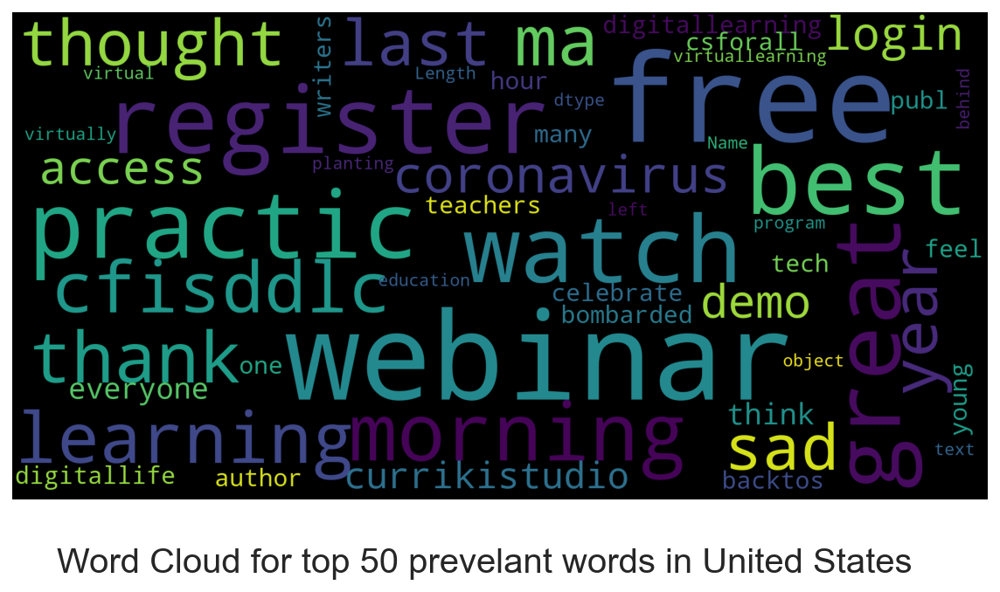

In [20]:
draw_word_cloud(dislearn_df,'United States', 'Word Cloud for top 50 prevelant words in United States')

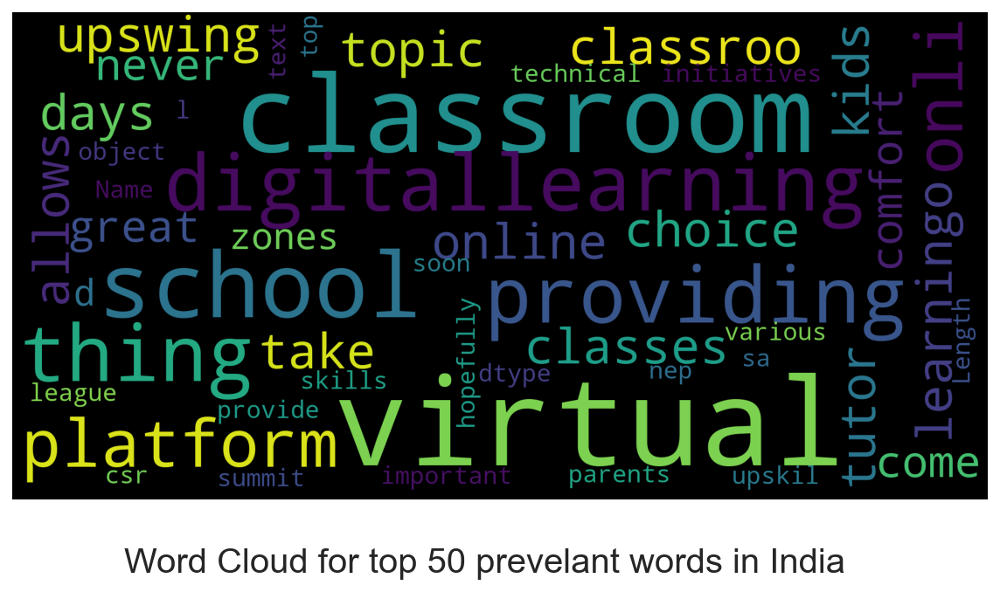

In [21]:
draw_word_cloud(dislearn_df, 'India', 'Word Cloud for top 50 prevelant words in India')

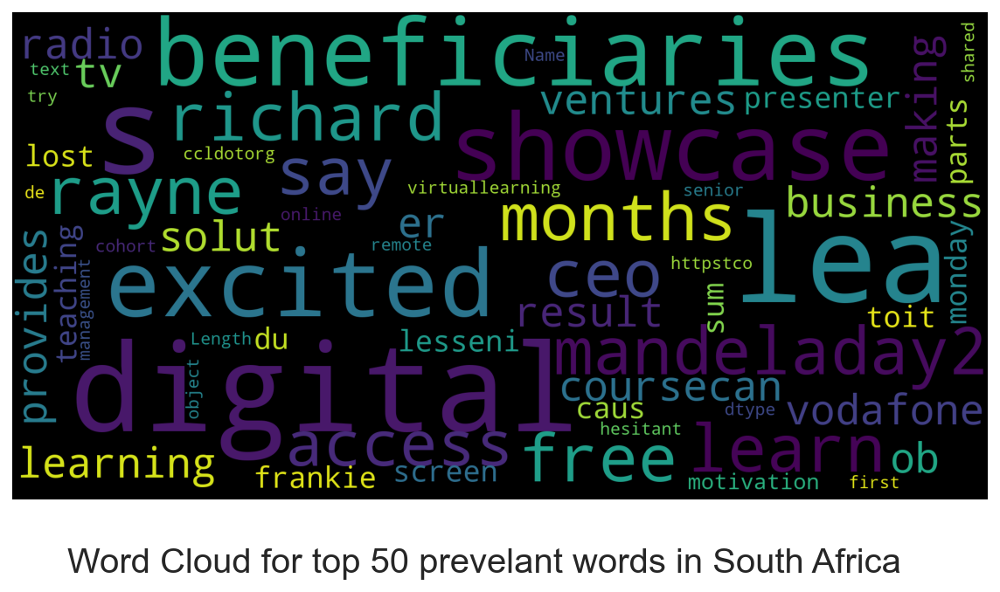

In [22]:
draw_word_cloud(dislearn_df, 'South Africa', 'Word Cloud for top 50 prevelant words in South Africa')

In [23]:
#Just split day and time into separate columns

dislearn_df['date'] = pd.to_datetime(dislearn_df['date'],  errors='coerce') 
dislearn_df = dislearn_df.sort_values(['date'])
dislearn_df['day'] = dislearn_df['date'].astype(str).str.split(' ', expand=True)[0]
dislearn_df['time'] = dislearn_df['date'].astype(str).str.split(' ', expand=True)[1]
dislearn_df.head()

,text,user_location,user_name,Retweet-Count,Favorites,date,day,time
199957,@teacher2teacher Modeling through video record...,Northwest Arkansas,JulieBoatright,0,1,2020-07-23 23:51:34,2020-07-23,23:51:34
148928,@teacher2teacher Modeling through video record...,Northwest Arkansas,JulieBoatright,0,1,2020-07-23 23:51:34,2020-07-23,23:51:34
46532,Are you pushing out the best content you can t...,"Menlo Park, CA",swivl,0,1,2020-07-23 23:57:06,2020-07-23,23:57:06
1169,Practicing new ways to teach online. https://t...,NA,MrsMarcieRodri,0,2,2020-07-23 23:59:35,2020-07-23,23:59:35
174454,😁 Interesting article about cinemas @BBCCultur...,"Bogota, Colombia",Avantilanguage,0,0,2020-07-24 00:00:00,2020-07-24,00:00:00


In [24]:
dislearn_df['hour'] = dislearn_df['date'].dt.hour
ds = dislearn_df['hour'].value_counts().reset_index()
ds.columns = ['hour', 'count']
ds['hour'] = 'Hour ' + ds['hour'].astype(str)
fig = px.bar(
    ds, 
    x="hour", 
    y="count", 
    orientation='v', 
    title='Tweets distribution over hours', 
    width=800
)
fig.show()

In [25]:
dislearn_df['location'] = dislearn_df['user_location'].str.split(',', expand=True)[1].str.lstrip().str.rstrip()
res = dislearn_df.groupby(['day', 'location'])['text'].count().reset_index()

In [26]:
country_dict = {}
for c in countries:
    country_dict[c.name] = c.alpha3
    
res['alpha3'] = res['location']
res = res.replace({"alpha3": country_dict})

country_list = ['England', 'United States', 'United Kingdom', 'London', 'UK']

res = res[
    (res['alpha3'] == 'USA') | 
    (res['location'].isin(country_list)) | 
    (res['location'] != res['alpha3'])
]

gbr = ['England', 'UK', 'London', 'United Kingdom']
us = ['United States', 'NY', 'CA', 'GA']

res = res[res['location'].notnull()]
res.loc[res['location'].isin(gbr), 'alpha3'] = 'GBR'
res.loc[res['location'].isin(us), 'alpha3'] = 'USA'
res.loc[res['alpha3'] == 'USA', 'location'] = 'USA'
res.loc[res['alpha3'] == 'GBR', 'location'] = 'United Kingdom'
plot = res.groupby(['day', 'location', 'alpha3'])['text'].sum().reset_index()
plot

,day,location,alpha3,text
0,2020-07-24,Australia,AUS,6
1,2020-07-24,Canada,CAN,3
2,2020-07-24,China,CHN,2
3,2020-07-24,Colombia,COL,2
4,2020-07-24,Croatia,HRV,1
...,...,...,...,...
1043,2020-08-14,Malaysia,MYS,1
1044,2020-08-14,Philippines,PHL,3
1045,2020-08-14,South Africa,ZAF,1
1046,2020-08-14,USA,USA,126


In [27]:
fig = px.choropleth(
    plot, 
    locations="alpha3",
    hover_name='location',
    color="text",
    animation_frame='day',
    projection="natural earth",
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Tweets from different countries for every day',
    width=800, 
    height=600
)
fig.show()

In [28]:
res = dislearn_df.groupby(['day', 'location', 'user_name'])['text'].count().reset_index()
res = res[['day', 'location', 'user_name']]
res['alpha3'] = res['location']
res = res.replace({"alpha3": country_dict})

country_list = ['England', 'United States', 'United Kingdom', 'London', 'UK']

res = res[
    (res['alpha3'] == 'USA') | 
    (res['location'].isin(country_list)) | 
    (res['location'] != res['alpha3'])
]

gbr = ['England', 'UK', 'London', 'United Kingdom']
us = ['United States', 'NY', 'CA', 'GA']

res = res[res['location'].notnull()]
res.loc[res['location'].isin(gbr), 'alpha3'] = 'GBR'
res.loc[res['location'].isin(us), 'alpha3'] = 'USA'
res.loc[res['alpha3'] == 'USA', 'location'] = 'USA'
res.loc[res['alpha3'] == 'GBR', 'location'] = 'United Kingdom'
plot = res.groupby(['day', 'location', 'alpha3'])['user_name'].count().reset_index()

In [29]:
fig = px.choropleth(
    plot, 
    locations="alpha3",
    hover_name='location',
    color="user_name",
    animation_frame='day',
    projection="natural earth",
    color_continuous_scale=px.colors.sequential.Plasma,
    title='Numbers of active users for every day',
    width=800, 
    height=600
)
fig.show()

In [30]:
dislearn_df.head()

,text,user_location,user_name,Retweet-Count,Favorites,date,day,time,hour,location
199957,@teacher2teacher Modeling through video record...,Northwest Arkansas,JulieBoatright,0,1,2020-07-23 23:51:34,2020-07-23,23:51:34,23,None
148928,@teacher2teacher Modeling through video record...,Northwest Arkansas,JulieBoatright,0,1,2020-07-23 23:51:34,2020-07-23,23:51:34,23,None
46532,Are you pushing out the best content you can t...,"Menlo Park, CA",swivl,0,1,2020-07-23 23:57:06,2020-07-23,23:57:06,23,CA
1169,Practicing new ways to teach online. https://t...,NA,MrsMarcieRodri,0,2,2020-07-23 23:59:35,2020-07-23,23:59:35,23,None
174454,😁 Interesting article about cinemas @BBCCultur...,"Bogota, Colombia",Avantilanguage,0,0,2020-07-24 00:00:00,2020-07-24,00:00:00,0,Colombia


In [31]:
dislearn_df.drop(['user_location','Retweet-Count','Favorites','date','hour','location'], axis = 1, inplace = True)
dislearn_df.drop_duplicates()
dislearn_df.head()

,text,user_name,day,time
199957,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34
148928,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34
46532,Are you pushing out the best content you can t...,swivl,2020-07-23,23:57:06
1169,Practicing new ways to teach online. https://t...,MrsMarcieRodri,2020-07-23,23:59:35
174454,😁 Interesting article about cinemas @BBCCultur...,Avantilanguage,2020-07-24,00:00:00


In [32]:
dislearn_df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 202645 entries, 199957 to 3430
Data columns (total 4 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   text       202645 non-null  object
 1   user_name  202645 non-null  object
 2   day        202645 non-null  object
 3   time       202645 non-null  object
dtypes: object(4)
memory usage: 7.7+ MB


In [33]:
dislearn_df = dislearn_df.rename(columns={'text': 'tweet', 'day': 'date'})
dislearn_df.head()

,tweet,user_name,date,time
199957,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34
148928,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34
46532,Are you pushing out the best content you can t...,swivl,2020-07-23,23:57:06
1169,Practicing new ways to teach online. https://t...,MrsMarcieRodri,2020-07-23,23:59:35
174454,😁 Interesting article about cinemas @BBCCultur...,Avantilanguage,2020-07-24,00:00:00


In [34]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx as nx

import nltk
from nltk.corpus import stopwords
stopwords=set(stopwords.words('english'))
from nltk.util import ngrams
from nltk import bigrams
nltk.download('stopwords')

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()
%config InlineBackend.figure_format = 'retina'

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\nimes\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [35]:
df_new = dislearn_df[dislearn_df['tweet'].notnull()]
df_new['text'] = df_new['tweet'].apply(lambda x: ' '.join([item for item in x.split() if item not in stopwords]))
print(df_new)

                                                    tweet       user_name  \
199957  @teacher2teacher Modeling through video record...  JulieBoatright   
148928  @teacher2teacher Modeling through video record...  JulieBoatright   
46532   Are you pushing out the best content you can t...           swivl   
1169    Practicing new ways to teach online. https://t...  MrsMarcieRodri   
174454  😁 Interesting article about cinemas @BBCCultur...  Avantilanguage   
...                                                   ...             ...   
3434    Punahou's Case Middle School students &amp; th...      PunahouPFA   
3433    @InteriorsAvenue Remembering to socially dista...        IanSyson   
3432    @kapease @TrumpRulzz @MarissaMeleske Tweet was...        kddavi63   
3431    At the point where there’s no course but to co...   DeplorableGPX   
3430    @jamesfbrophy @NonbinarySaru That point could ...         Twopaw1   

              date      time  \
199957  2020-07-23  23:51:34   
148928  202

In [36]:
#Remove Urls and HTML links
def remove_urls(text):
    url_remove = re.compile(r'https?://\S+|www\.\S+')
    return url_remove.sub(r'', text)
df_new['text']=df_new['text'].apply(lambda x:remove_urls(x))

def remove_html(text):
    html=re.compile(r'<.*?>')
    return html.sub(r'',text)
df_new['text']=df_new['text'].apply(lambda x:remove_html(x))

# Lower casing
def lower(text):
    low_text= text.lower()
    return low_text
df_new['text']=df_new['text'].apply(lambda x:lower(x))

# Number removal
def remove_num(text):
    remove= re.sub(r'\d+', '', text)
    return remove
df_new['text']=df_new['text'].apply(lambda x:remove_num(x))

def punct_remove(text):
    punct = re.sub(r"[^\w\s\d]","", text)
    return punct
df_new['text']=df_new['text'].apply(lambda x:punct_remove(x))

def remove_mention(x):
    text=re.sub(r'@\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_mention(x))

def remove_hash(x):
    text=re.sub(r'#\w+','',x)
    return text
df_new['text']=df_new['text'].apply(lambda x:remove_hash(x))

#Remove extra white space left while removing stuff
def remove_space(text):
    space_remove = re.sub(r"\s+"," ",text).strip()
    return space_remove
df_new['text']=df_new['text'].apply(lambda x:remove_space(x))

###########################################################################################################

'''
def clean(text):
    text = re.sub('https?://\S+|www\.\S+', '', text)  
    text = re.sub(r'\s+', ' ', text, flags=re.I)
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub(r'@\w+','',text)
    text = re.sub(r'#\w+','',text)
    return text   
df_new['text'] = df_new['text'].apply(lambda x:clean(x))
'''
#All the lexical features were rated for the polarity and intensity on a scale from “-4: Extremely Negative” to “+4 Extremely Positive


from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer

new_words = {
    'positive covid': -3.0,
    'positive cases': -3.0,
    'tested positive': -3.0,
    'tests positive': -3.0,
}

analyser = SentimentIntensityAnalyzer()
analyser.lexicon.update(new_words)

scores=[]
for i in range(len(df_new['text'])):
    
    score = analyser.polarity_scores(df_new['text'][i])
    score=score['compound']
    scores.append(score)
sentiment=[]
for i in scores:
    if i>=0.05:
        sentiment.append('Positive')
    elif i<=(-0.05):
        sentiment.append('Negative')
    else:
        sentiment.append('Neutral')
df_new['sentiment']=pd.Series(np.array(sentiment))

In [37]:
df_new.head()

,tweet,user_name,date,time,text,sentiment
199957,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34,teacherteacher modeling video recording comple...,Negative
148928,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34,teacherteacher modeling video recording comple...,Negative
46532,Are you pushing out the best content you can t...,swivl,2020-07-23,23:57:06,are pushing best content students what say mat...,Positive
1169,Practicing new ways to teach online. https://t...,MrsMarcieRodri,2020-07-23,23:59:35,practicing new ways teach online fun way imple...,Positive
174454,😁 Interesting article about cinemas @BBCCultur...,Avantilanguage,2020-07-24,00:00:00,interesting article cinemas bbcculture learnen...,Positive


In [38]:
# format timestamp
df_new['created_at'] = pd.to_datetime(df_new['date'])
df_new['created_at'] = pd.IntervalIndex(pd.cut(df_new['created_at'], pd.date_range('2020-01-09', '2021-02-28'))).left

# count sentiment
tweet_count1 = df_new.groupby(['created_at','sentiment'])['text'].count().reset_index().rename(columns={'text':'count'})
tweet_count1.head(5)

# check missing values
# tweet_count1.isna().sum()

,created_at,sentiment,count
0,2020-07-22,Negative,2
1,2020-07-22,Positive,2
2,2020-07-23,Negative,138
3,2020-07-23,Neutral,486
4,2020-07-23,Positive,1134


<function matplotlib.pyplot.show(close=None, block=None)>

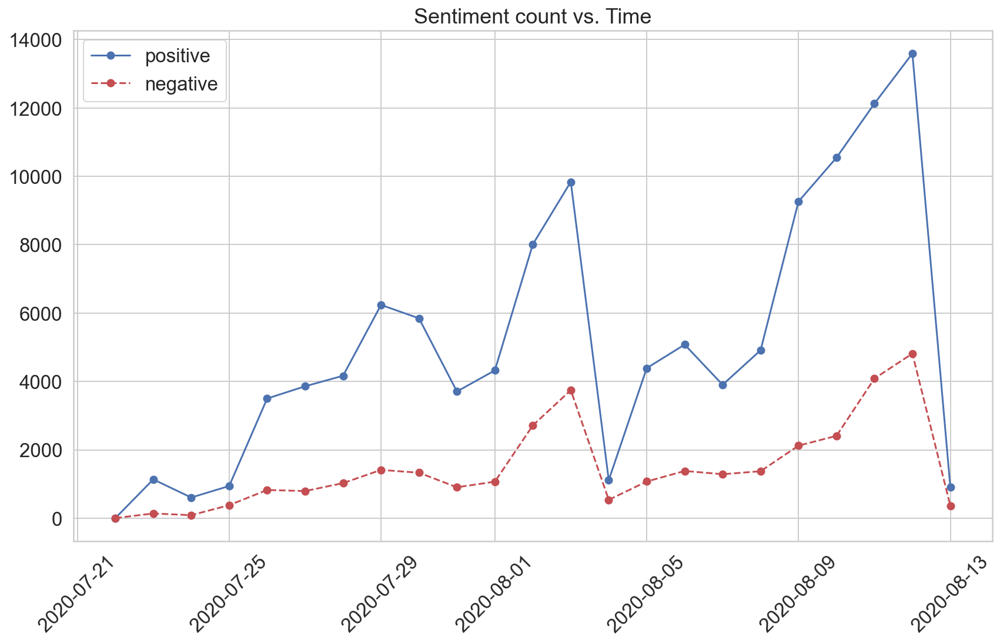

In [39]:
#format sentiment table
times = tweet_count1.loc[tweet_count1['sentiment'] == 'Negative']['created_at'].reset_index(drop = True)
pos = tweet_count1.loc[tweet_count1['sentiment'] == 'Positive']['count'].reset_index(drop = True)
neu = tweet_count1.loc[tweet_count1['sentiment'] == 'Neutral']['count'].reset_index(drop = True)
neg = tweet_count1.loc[tweet_count1['sentiment'] == 'Negative']['count'].reset_index(drop = True)

plt.figure(figsize=(14,8))
plt.xticks(rotation='45')
plt.title("Sentiment count vs. Time")

lin1=plt.plot(times, pos, 'bo-', label='positive')
lin3=plt.plot(times, neg, 'ro--', label='negative')
plt.legend()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

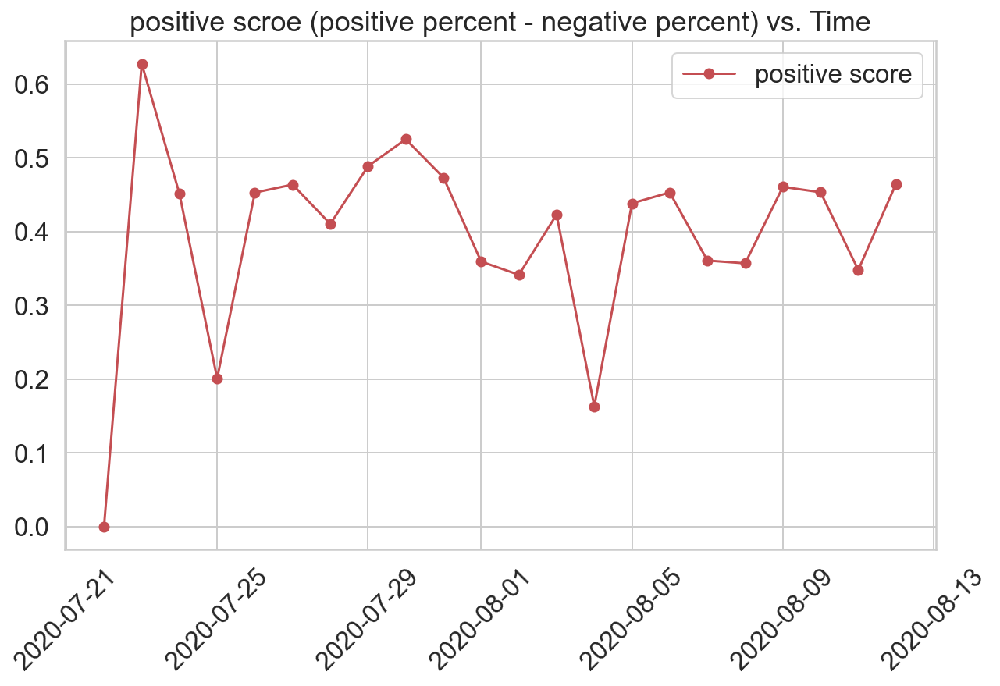

In [40]:
# "score" is defined as percent of positive tweets minus percent of negative tweets
score = (pos - neg) / (pos + neu + neg)

plt.figure(figsize=(10,6))
plt.xticks(rotation='45')
plt.title("positive scroe (positive percent - negative percent) vs. Time")

lin1=plt.plot(times, score, 'ro-', label='positive score')
plt.legend()
plt.show

(-0.5, 399.5, 199.5, -0.5)

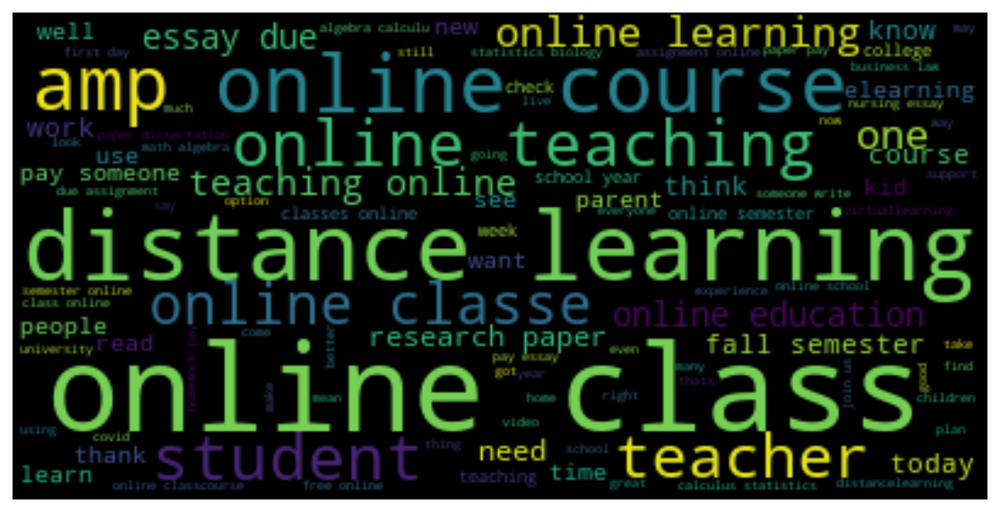

In [41]:
from wordcloud import WordCloud, STOPWORDS , ImageColorGenerator

tweet_All = " ".join(review for review in df_new.text)


fig, ax = plt.subplots(1, 1, figsize  = (16,5))
# Create and generate a word cloud image:
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(tweet_All)

# Display the generated image:
ax.imshow(wordcloud_ALL, interpolation='bilinear')

ax.axis('off')

In [42]:
df_new['text']

199957    teacherteacher modeling video recording comple...
148928    teacherteacher modeling video recording comple...
46532     are pushing best content students what say mat...
1169      practicing new ways teach online fun way imple...
174454    interesting article cinemas bbcculture learnen...
                                ...                        
3434      punahous case middle school students amp famil...
3433      interiorsavenue remembering socially distance ...
3432      kapease trumprulzz marissameleske tweet open a...
3431      at point theres course completely distance def...
3430      jamesfbrophy nonbinarysaru that point could gr...
Name: text, Length: 202645, dtype: object

In [43]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,118005
1,Neutral,50774
0,Negative,33866


In [44]:
temp = df_new.groupby('sentiment').count()['text'].reset_index().sort_values(by='text',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,text
2,Positive,118005
1,Neutral,50774
0,Negative,33866


<AxesSubplot:xlabel='sentiment', ylabel='count'>

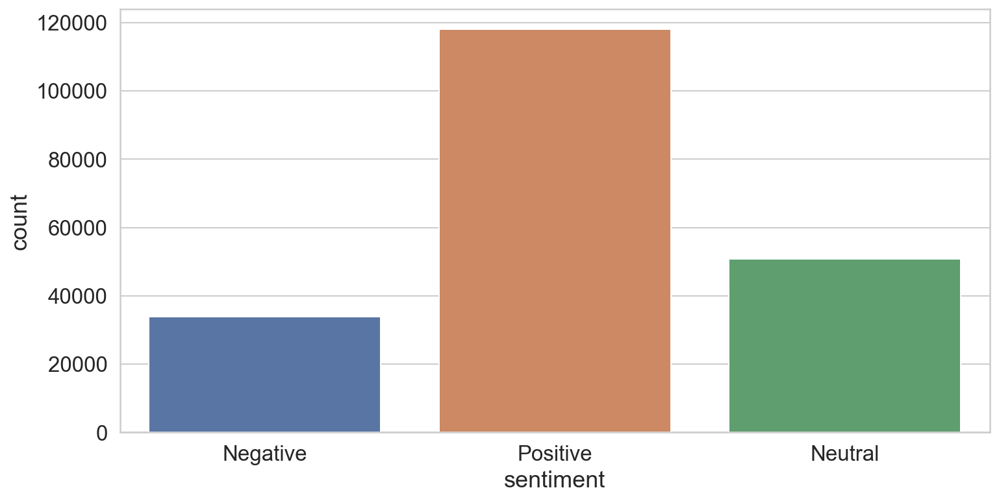

In [45]:
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_new)

In [46]:
import plotly.graph_objs as go

fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.text,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

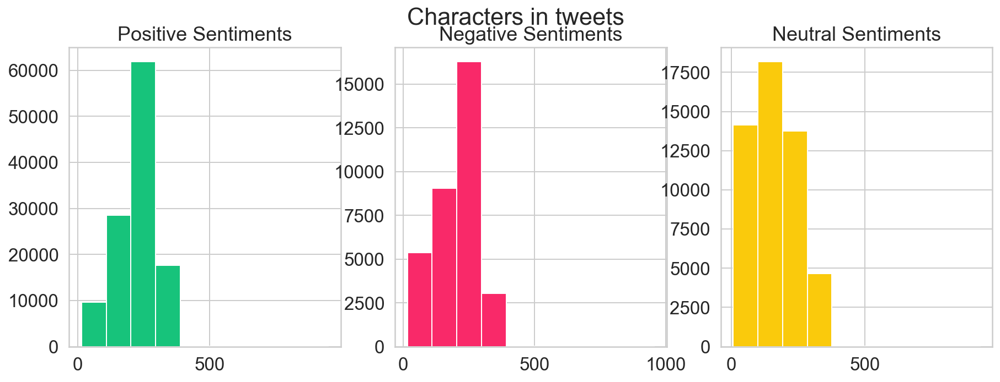

In [47]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.len()
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')

tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.len()
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.len()
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Characters in tweets')
plt.show()

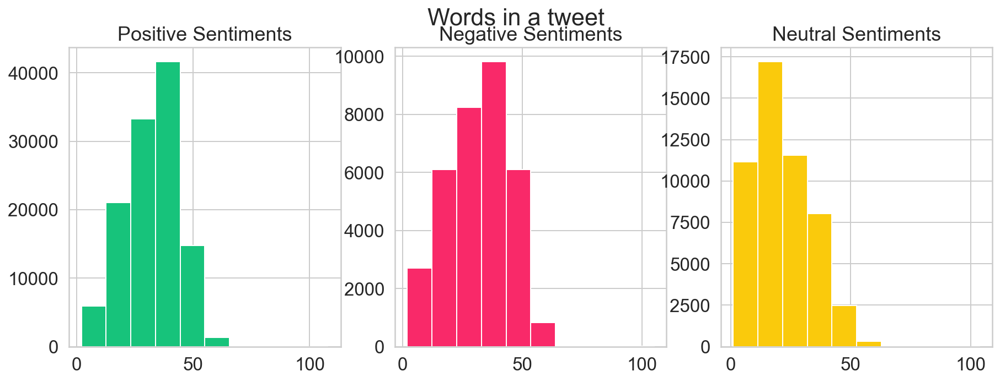

In [48]:
fig,(ax1,ax2,ax3)=plt.subplots(1,3,figsize=(15,5))

tweet_len=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().map(lambda x: len(x))
ax1.hist(tweet_len,color='#17C37B')
ax1.set_title('Positive Sentiments')


tweet_len=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().map(lambda x: len(x))
ax2.hist(tweet_len,color='#F92969')
ax2.set_title('Negative Sentiments')

tweet_len=df_new[df_new['sentiment']=="Neutral"]['tweet'].str.split().map(lambda x: len(x))
ax3.hist(tweet_len,color='#FACA0C')
ax3.set_title('Neutral Sentiments')

fig.suptitle('Words in a tweet')
plt.show()

Text(0.5, 0.98, 'Average word length in each tweet')

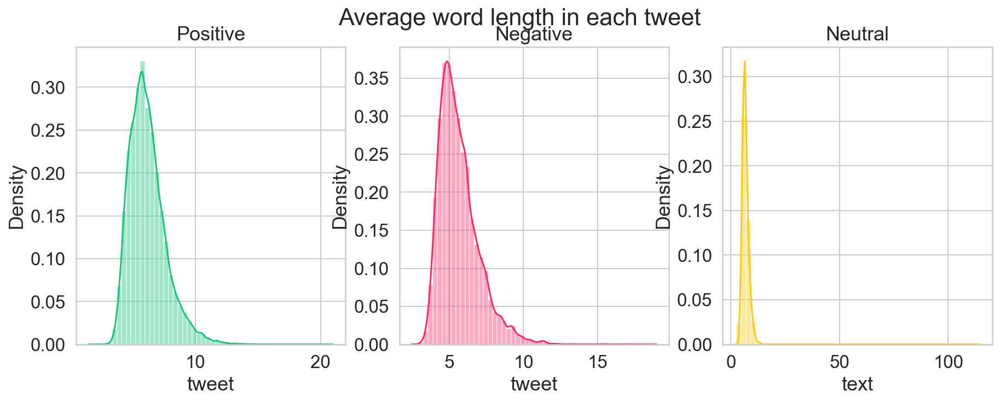

In [49]:
fig,(ax1,ax2, ax3)=plt.subplots(1,3,figsize=(15,5))

word=df_new[df_new['sentiment']=="Positive"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax1,color='#17C37B')
ax1.set_title('Positive')


word=df_new[df_new['sentiment']=="Negative"]['tweet'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax2,color='#F92969')
ax2.set_title('Negative')

word=df_new[df_new['sentiment']=="Neutral"]['text'].str.split().apply(lambda x : [len(i) for i in x])
sns.distplot(word.map(lambda x: np.mean(x)),ax=ax3,color='#FACA0C')
ax3.set_title('Neutral')


fig.suptitle('Average word length in each tweet')

In [50]:
np.array(stopwords)

array({'not', 'its', 'doing', 'what', "doesn't", "shan't", 'isn', 'this', 'they', "hasn't", 'after', 'ours', 'down', 'as', 'shan', 'into', 'only', "don't", 'himself', 'them', 'itself', 'ma', 'had', 'in', 'because', 'being', 'out', 'further', 'no', 'about', 'herself', 'and', 'against', 'on', 'shouldn', 'hers', 'more', 'under', 'below', 'we', 'yourself', 'am', 'from', 'there', 'll', 'themselves', 'own', 'm', 'why', 'any', 'those', 'o', 'he', 'mightn', "wasn't", 'your', 'didn', 'was', 'same', 'd', 'again', 'myself', "you're", 'if', 'doesn', "hadn't", "you'll", 'do', 'by', 'has', 'be', 'these', 'with', 'my', 'are', "you'd", 'don', 'some', 'you', 'while', 'me', 'over', 'once', 'him', 'before', 'off', "mustn't", 'y', 'than', 'couldn', 'between', 'weren', 'most', 'other', 'the', 'our', 'both', 'but', "it's", 'whom', 'now', "couldn't", 'few', 'her', 'wasn', 'his', "needn't", 'up', 'can', 'were', 'been', 'during', 'until', 'having', 'have', 'above', 'will', "mightn't", 'ourselves', "weren't", '

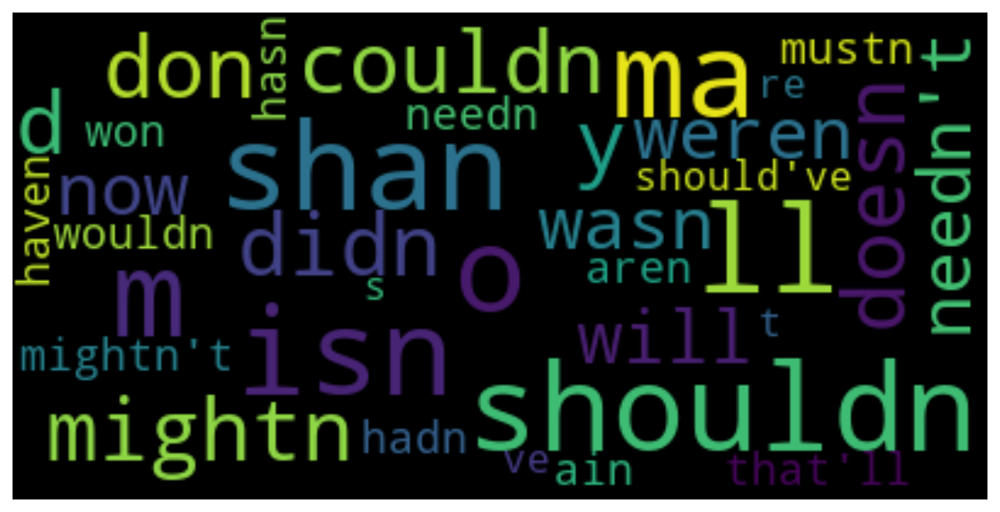

In [51]:
comment_words = '' 
stopwords1 = set(STOPWORDS) 
  
for val in stopwords: 
      
    # typecaste each val to string 
    val = str(val) 
    # split the value 
    tokens = val.split() 
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
fig, ax = plt.subplots(1, 1, figsize  = (16,5))
wordcloud_ALL = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(comment_words)



# plot the WordCloud image                        
ax.imshow(wordcloud_ALL, interpolation='bilinear')
ax.axis('off')
  
plt.show() 

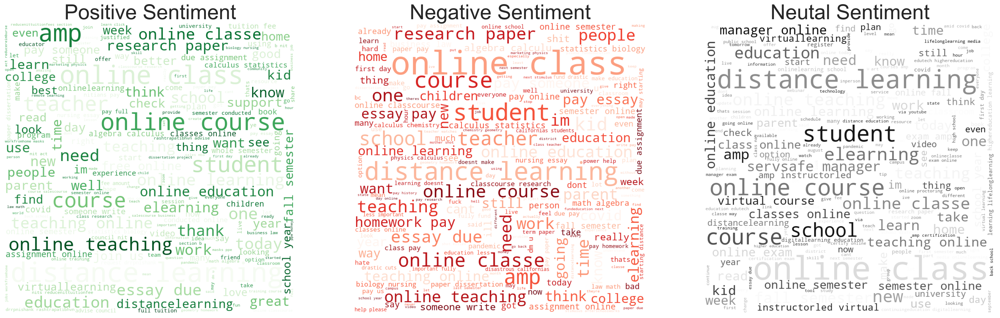

In [52]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=[30, 15])

df_pos = df_new[df_new["sentiment"]=="Positive"]
df_neg = df_new[df_new["sentiment"]=="Negative"]
df_neu = df_new[df_new["sentiment"]=="Neutral"]

comment_words = '' 
stopwords = set(STOPWORDS) 

for val in df_pos.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
   
wordcloud1 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greens",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 

ax1.imshow(wordcloud1)
ax1.axis('off')
ax1.set_title('Positive Sentiment',fontsize=35);

comment_words = ''

for val in df_neg.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud2 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Reds",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words)  
ax2.imshow(wordcloud2)
ax2.axis('off')
ax2.set_title('Negative Sentiment',fontsize=35);

comment_words = ''
for val in df_neu.text: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
    
wordcloud3 = WordCloud(width = 800, height = 800, 
                background_color ='white',
                colormap="Greys",
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
ax3.imshow(wordcloud3)
ax3.axis('off')
ax3.set_title('Neutal Sentiment',fontsize=35);

In [53]:
from collections import defaultdict

# Define functions
def generate_ngrams(text, n_gram=1):
    token = [token for token in text.lower().split(' ') if token != '' if token not in STOPWORDS]
    ngrams = zip(*[token[i:] for i in range(n_gram)])
    return [' '.join(ngram) for ngram in ngrams]

N = 30


positive= df_new["sentiment"]== "Positive"
negative= df_new["sentiment"]== "Negative"
neutral= df_new["sentiment"]== "Neutral"

positive_unigrams = defaultdict(int)
neutral_unigrams = defaultdict(int)
negative_unigrams = defaultdict(int)

# Unigrams
for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet):
        positive_unigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet):
        negative_unigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet):
        neutral_unigrams[word] += 1        
        
df_positive_unigrams = pd.DataFrame(sorted(positive_unigrams.items(), key=lambda x: x[1])[::-1])
df_negative_unigrams = pd.DataFrame(sorted(negative_unigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_unigrams = pd.DataFrame(sorted(neutral_unigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=150)
plt.tight_layout()

sns.barplot(y=df_positive_unigrams[0].values[:N], x=df_positive_unigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_unigrams[0].values[:N], x=df_negative_unigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_unigrams[0].values[:N], x=df_neutral_unigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common unigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common unigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common unigrams in Neutral Tweets', fontsize=15)

plt.show()

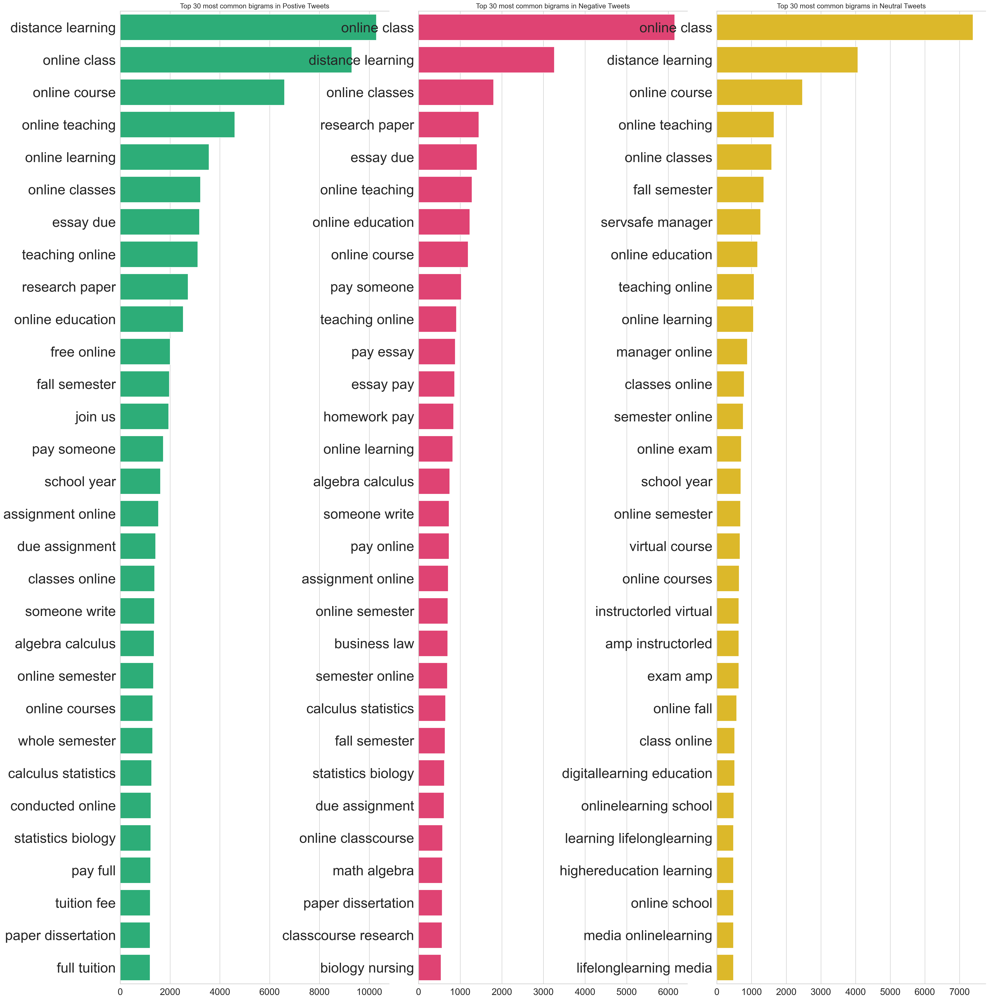

In [54]:
# Bigrams
positive_bigrams = defaultdict(int)
neutral_bigrams = defaultdict(int)
negative_bigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        positive_bigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        negative_bigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=2):
        neutral_bigrams[word] += 1        
        
df_positive_bigrams = pd.DataFrame(sorted(positive_bigrams.items(), key=lambda x: x[1])[::-1])
df_negative_bigrams = pd.DataFrame(sorted(negative_bigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_bigrams = pd.DataFrame(sorted(neutral_bigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_bigrams[0].values[:N], x=df_positive_bigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_bigrams[0].values[:N], x=df_negative_bigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_bigrams[0].values[:N], x=df_neutral_bigrams[1].values[:N], ax=axes[2], color='#FACA0C')


for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common bigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common bigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common bigrams in Neutral Tweets', fontsize=15)

plt.show()

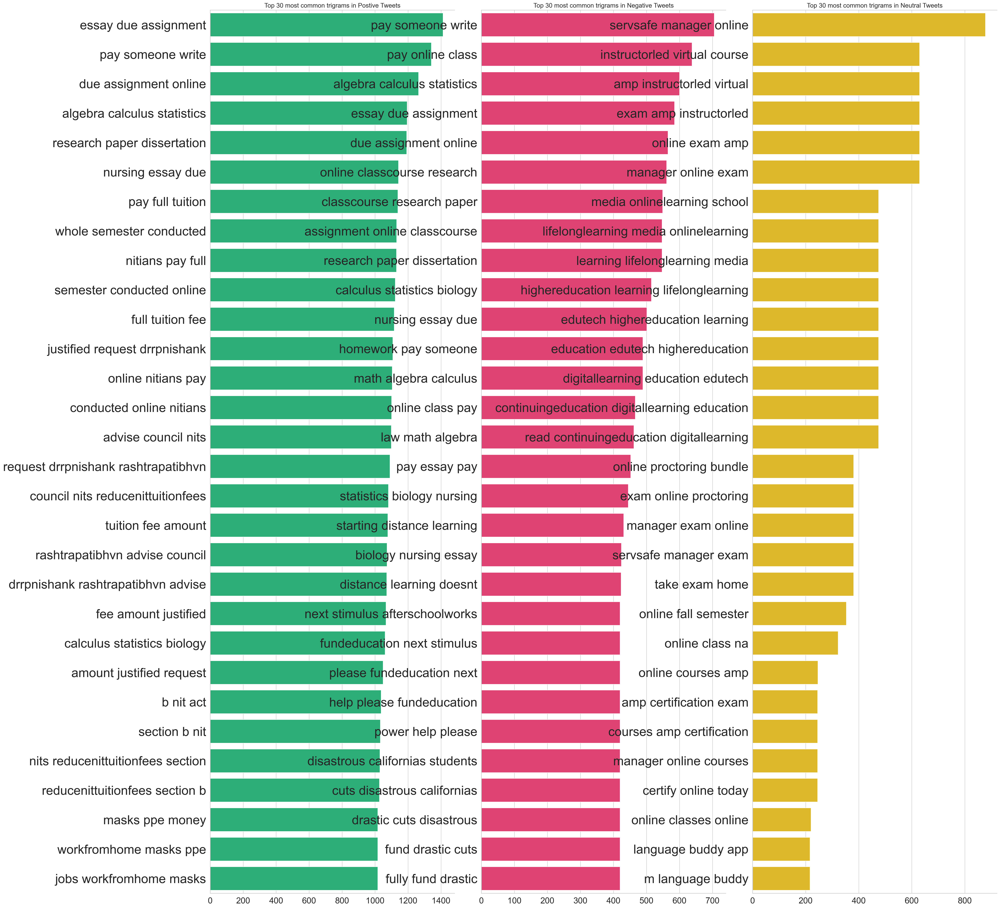

In [55]:
# Trigrams
positive_trigrams = defaultdict(int)
neutral_trigrams = defaultdict(int)
negative_trigrams = defaultdict(int)

for tweet in df_new[positive]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        positive_trigrams[word] += 1
        
for tweet in df_new[negative]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        negative_trigrams[word] += 1
        
for tweet in df_new[neutral]['text']:
    for word in generate_ngrams(tweet, n_gram=3):
        neutral_trigrams[word] += 1        
        
df_positive_trigrams = pd.DataFrame(sorted(positive_trigrams.items(), key=lambda x: x[1])[::-1])
df_negative_trigrams = pd.DataFrame(sorted(negative_trigrams.items(), key=lambda x: x[1])[::-1])
df_neutral_trigrams = pd.DataFrame(sorted(neutral_trigrams.items(), key=lambda x: x[1])[::-1])


fig, axes = plt.subplots(ncols=3, figsize=(27, 30), dpi=100)
plt.tight_layout()

sns.barplot(y=df_positive_trigrams[0].values[:N], x=df_positive_trigrams[1].values[:N], ax=axes[0], color='#17C37B')
sns.barplot(y=df_negative_trigrams[0].values[:N], x=df_negative_trigrams[1].values[:N], ax=axes[1], color='#F92969')
sns.barplot(y=df_neutral_trigrams[0].values[:N], x=df_neutral_trigrams[1].values[:N], ax=axes[2], color='#FACA0C')




for i in range(3):
    axes[i].spines['right'].set_visible(False)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].tick_params(axis='y', labelsize=30)

axes[0].set_title(f'Top {N} most common trigrams in Postive Tweets', fontsize=15)
axes[1].set_title(f'Top {N} most common trigrams in Negative Tweets', fontsize=15)
axes[2].set_title(f'Top {N} most common trigrams in Neutral Tweets', fontsize=15)

plt.show()

In [56]:
df_new.head()

,tweet,user_name,date,time,text,sentiment,created_at
199957,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34,teacherteacher modeling video recording comple...,Negative,2020-07-22
148928,@teacher2teacher Modeling through video record...,JulieBoatright,2020-07-23,23:51:34,teacherteacher modeling video recording comple...,Negative,2020-07-22
46532,Are you pushing out the best content you can t...,swivl,2020-07-23,23:57:06,are pushing best content students what say mat...,Positive,2020-07-22
1169,Practicing new ways to teach online. https://t...,MrsMarcieRodri,2020-07-23,23:59:35,practicing new ways teach online fun way imple...,Positive,2020-07-22
174454,😁 Interesting article about cinemas @BBCCultur...,Avantilanguage,2020-07-24,00:00:00,interesting article cinemas bbcculture learnen...,Positive,2020-07-23


In [57]:
len(df_new)

202645

In [58]:
#As words are in the order of csv files we imported , we have to shuffle the rows & Reindex

df_new = df_new.sample(frac=1).reset_index(drop=True)
df_new.head()

,tweet,user_name,date,time,text,sentiment,created_at
0,Hire an expert. Hmu\nbusiness law\nMath\nAlgeb...,superwriters19,2020-08-08,16:12:58,hire expert hmu business law math algebra calc...,Positive,2020-08-07
1,@mgoldst @dirka @miro @figma @figmadesign Pape...,miggi,2020-08-12,20:46:37,mgoldst dirka miro figma figmadesign paper lin...,Neutral,2020-08-11
2,Register for Online Training Classes.\nJoin Th...,Vakrangee_co,2020-07-31,06:48:37,register online training classes join the best...,Positive,2020-07-30
3,@CoachVass @CoachTrotter75 @coachhargitt Did y...,CoachJLBailey,2020-08-10,13:19:07,coachvass coachtrotter coachhargitt did experi...,Negative,2020-08-09
4,“Whether it’s brick or click...we’ve got this!...,HopeFBarr,2020-08-10,14:49:48,whether its brick clickweve got this nancy fre...,Neutral,2020-08-09


In [59]:
df_new_final = pd.concat([df_new.iloc[0:40000]])

In [60]:
len(df_new_final)

40000

In [61]:
export_csv = df_new_final.to_csv(r'distance learning tweets.csv')